# Przetwarzanie wstępne. Filtracja kontekstowa.


## Cel laboratorium:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
		- laplasjan,
		- operator Robertsa, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

## Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów. 
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele, dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, obraz po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

In [1]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/'
fileNames = ["jet.png", "kw.png", "moon.png", "lenaSzum.png", "lena.png", "plansza.png"]

for fileName in fileNames:
    if not os.path.exists(fileName):
        r = requests.get(url + fileName, allow_redirects = True)
        open(fileName, 'wb').write(r.content)

In [2]:
# pomocnicza funkcja do wyświetlenia obrazu oryginalnego i po filtracji wraz z modułem z różnicy
def show_original_filter_abs(original, filtered, orig_name):
    diff_abs = np.abs(original - filtered)
    
    fig, axs = plt.subplots(1, 3)
    fig.set_size_inches(18, 6)
    fig.suptitle("Wspólny wykres oryginalnego obrazka, obrazka po filtracji i modułu z różnicy", fontsize = 15)
    
    axs[0].imshow(original, 'gray', vmin = 0, vmax = 255)
    axs[0].set_title(f"Oryginalny obrazek {orig_name}")
    axs[0].axis('off')
    
    axs[1].imshow(filtered, 'gray', vmin = 0, vmax = 255)
    axs[1].set_title(f"Obrazek {orig_name} po filtracji")
    axs[1].axis('off')
    
    axs[2].imshow(diff_abs, 'gray', vmin = 0, vmax = 255)
    axs[2].set_title("Moduł z różnicy")
    axs[2].axis('off')

In [3]:
# pomocnicza funkcja do przygotowania podstawowego uśredniającego filtru konwolucji
def normalized_kernel(kernel_size = 3):
    kernel = np.ones((kernel_size, kernel_size))
    kernel /= np.sum(kernel)
    return kernel

In [4]:
plansza = cv2.imread('plansza.png') 
plansza = cv2.cvtColor(plansza, cv2.COLOR_BGR2GRAY)

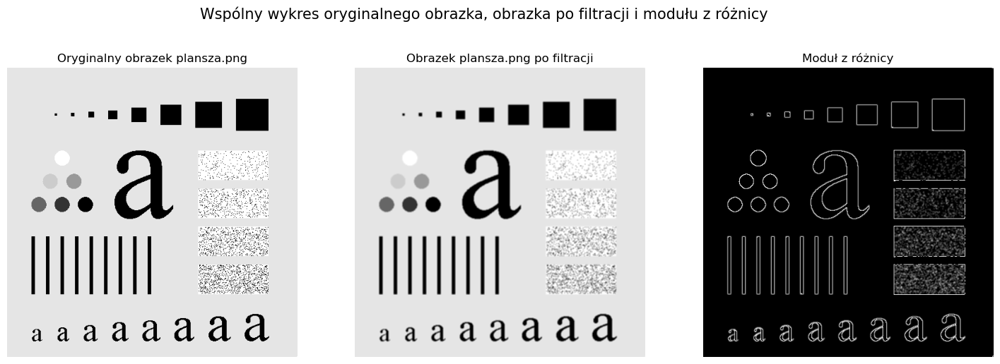

In [5]:
plansza_filtered = np.zeros_like(plansza)
cv2.filter2D(src = plansza, dst = plansza_filtered, ddepth = -1, kernel = normalized_kernel())
show_original_filter_abs(plansza, plansza_filtered, "plansza.png")


---

#### Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

Obraz "moduł z różnicy" zawiera przede wszystkim krawędzie, kontury obiektów z oryginalnego obrazu, ponieważ tam była różnica między wartościami pikseli, więc wartość po zadziałaniu filtra jest uśrednioną wartością między tłem a obiektem i różni się ona od oryginalnego obrazka. Również rozmazane zostały prostokąty po prawej stronie, co pozwoliło zmniejszyć szum. Można zatem powiedzieć, że filtracja dolnoprzepustowa pozwala zredukować szum, ale rozmazuje obrazek, bo wygładza krawędzie.

---


5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknami o rozmiarach: 3, 5, 9, 15 i 35. 
Wykorzystaj polecenie `plt.subplot`. 
Przeanalizuj wpływ rozmiaru maski na wynik.

In [6]:
filtered3 = np.zeros_like(plansza)
cv2.filter2D(src = plansza, dst = filtered3, ddepth = -1, kernel = normalized_kernel(3))

filtered5 = np.zeros_like(plansza)
cv2.filter2D(src = plansza, dst = filtered5, ddepth = -1, kernel = normalized_kernel(5))

filtered9 = np.zeros_like(plansza)
cv2.filter2D(src = plansza, dst = filtered9, ddepth = -1, kernel = normalized_kernel(9))

filtered15 = np.zeros_like(plansza)
cv2.filter2D(src = plansza, dst = filtered15, ddepth = -1, kernel = normalized_kernel(15))

filtered35 = np.zeros_like(plansza)
cv2.filter2D(src = plansza, dst = filtered35, ddepth = -1, kernel = normalized_kernel(35))

print(end = '')

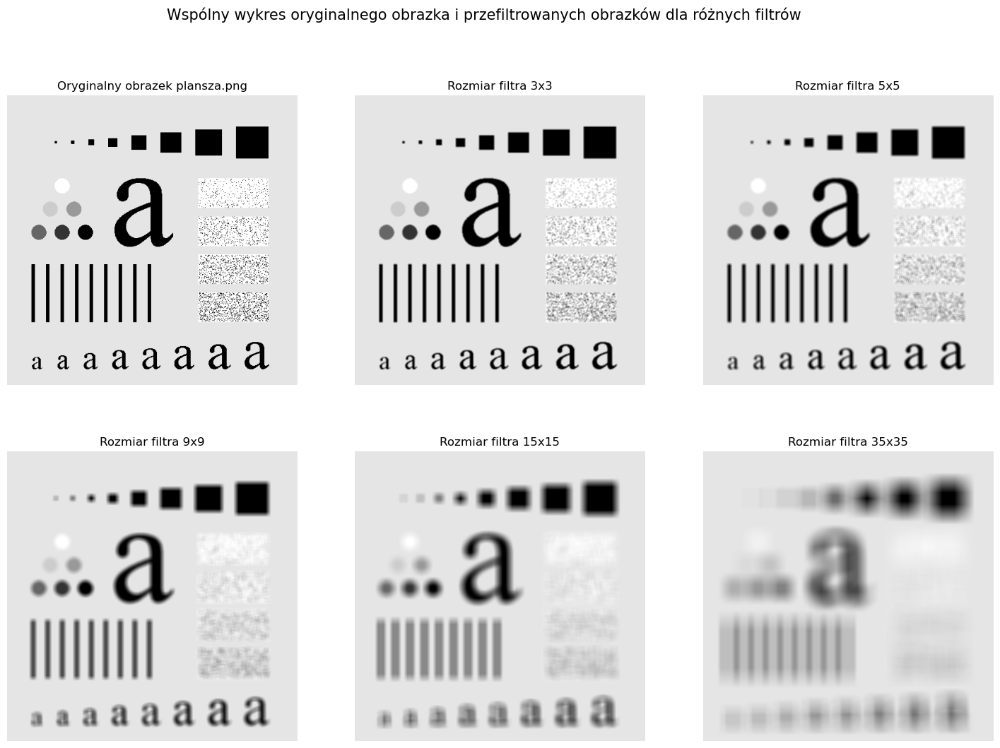

In [7]:
fig, axs = plt.subplots(2, 3)
fig.set_size_inches(18, 12)
fig.suptitle("Wspólny wykres oryginalnego obrazka i przefiltrowanych obrazków dla różnych filtrów", fontsize = 15)

axs[0, 0].imshow(plansza, 'gray', vmin = 0, vmax = 255)
axs[0, 0].set_title("Oryginalny obrazek plansza.png")
axs[0, 0].axis('off')

axs[0, 1].imshow(filtered3, 'gray', vmin = 0, vmax = 255)
axs[0, 1].set_title("Rozmiar filtra 3x3")
axs[0, 1].axis('off')

axs[0, 2].imshow(filtered5, 'gray', vmin = 0, vmax = 255)
axs[0, 2].set_title("Rozmiar filtra 5x5")
axs[0, 2].axis('off')

axs[1, 0].imshow(filtered9, 'gray', vmin = 0, vmax = 255)
axs[1, 0].set_title("Rozmiar filtra 9x9")
axs[1, 0].axis('off')

axs[1, 1].imshow(filtered15, 'gray', vmin = 0, vmax = 255)
axs[1, 1].set_title("Rozmiar filtra 15x15")
axs[1, 1].axis('off')

axs[1, 2].imshow(filtered35, 'gray', vmin = 0, vmax = 255)
axs[1, 2].set_title("Rozmiar filtra 35x35")
axs[1, 2].axis('off')

print(end = '')

6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

In [8]:
lena = cv2.imread('lena.png') 
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)

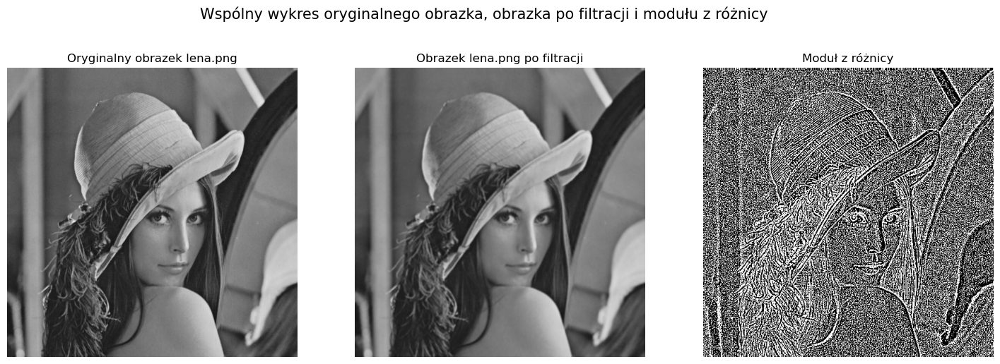

In [9]:
lena_filtered = np.zeros_like(lena)
cv2.filter2D(src = lena, dst = lena_filtered, ddepth = -1, kernel = normalized_kernel())
show_original_filter_abs(lena, lena_filtered, "lena.png")

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości. 
Częściowo można go zniwelować poprzez odpowiedni dobór maski. 
Wykorzystaj maskę:  `M = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])`. 
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich jej elementów: `M = M / sum(sum(M))`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki, tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

In [10]:
M = np.array([[1, 2, 1], 
              [2, 4, 2], 
              [1, 2, 1]])

M = M / sum(sum(M))

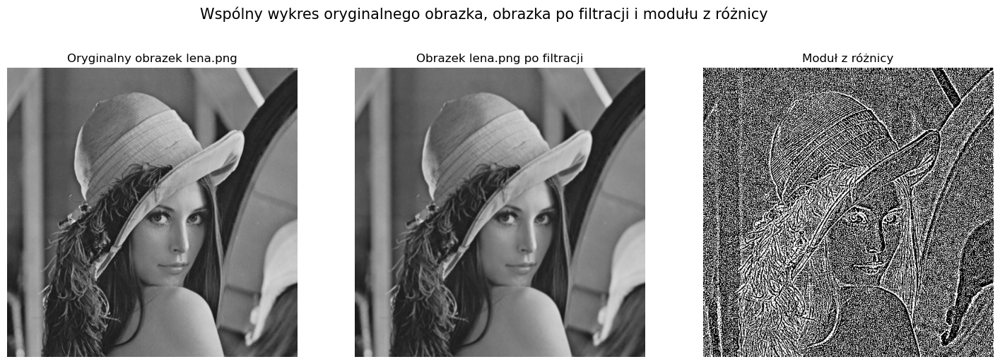

In [11]:
lena_filtered = np.zeros_like(lena)
cv2.filter2D(src = lena, dst = lena_filtered, ddepth = -1, kernel = M)
show_original_filter_abs(lena, lena_filtered, "lena.png")

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gaussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa. 
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian`, stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź, jak parametr **odchylenie standardowe** wpływa na "kształt" filtru.

  Uwaga - w OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2 lub 3) wartości odchylenia standardowego.

In [12]:
def fgaussian(size, sigma):
    m = n = size
    h, k = m // 2, n // 2
    x, y = np.mgrid[-h : h+1, -k : k+1]
    g = np.exp(-(x ** 2 + y ** 2) / (2 * sigma ** 2))
    return g / g.sum() 

def mesh(fun, size):
    fig = plt.figure()
    ax = plt.axes(projection = '3d')
    
    X = np.arange(-(size // 2), size // 2 + 1, 1)
    Y = np.arange(-(size // 2), size // 2 + 1, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun
    
    ax.plot_surface(X, Y, Z)
    plt.show()

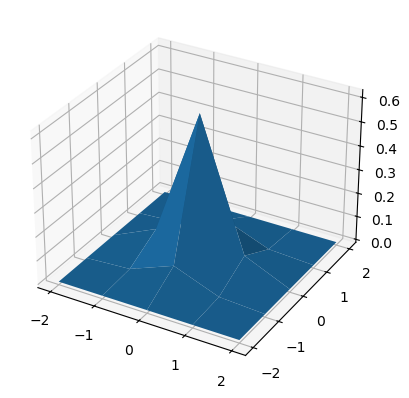

In [13]:
kernel1 = fgaussian(5, 0.5)
mesh(kernel1, 5)

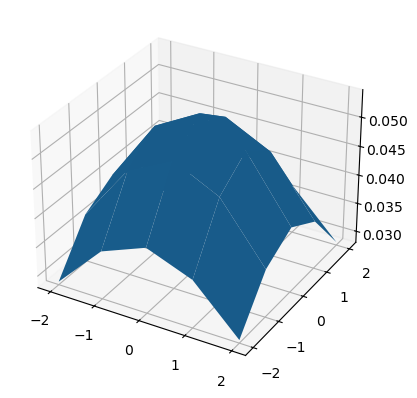

In [14]:
kernel2 = fgaussian(5, 2.5)
mesh(kernel2, 5)

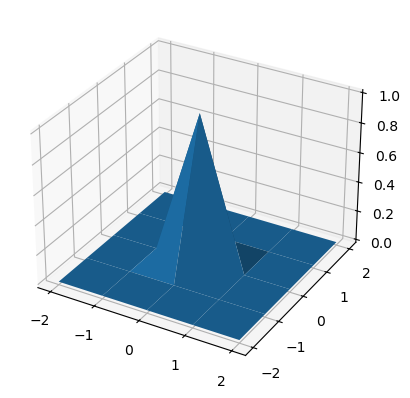

In [15]:
kernel3 = fgaussian(5, 0.25)
mesh(kernel3, 5)

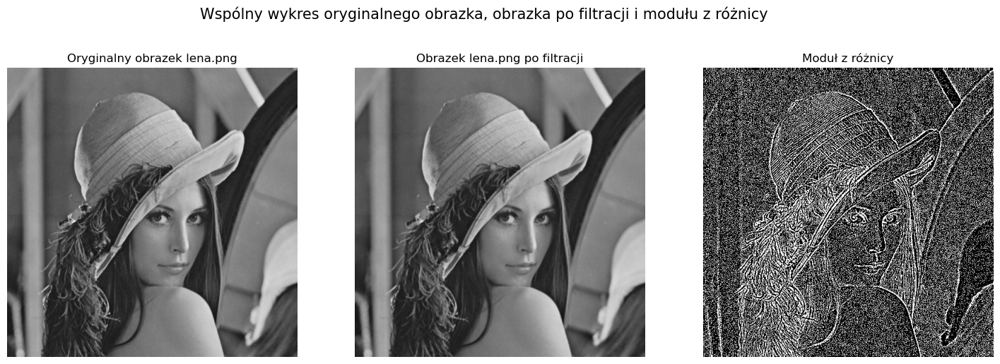

In [16]:
# odchylenie standardowe 0.5
lena_gauss1 = np.zeros_like(lena)
cv2.filter2D(src = lena, dst = lena_gauss1, ddepth = -1, kernel = kernel1)
show_original_filter_abs(lena, lena_gauss1, "lena.png")

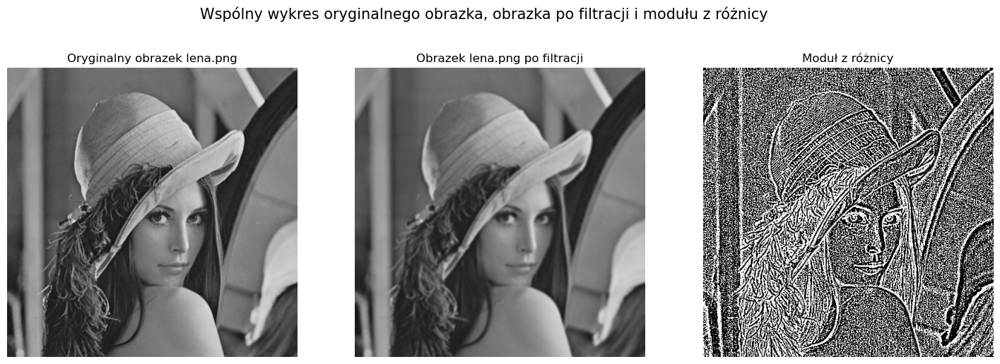

In [17]:
# odchylenie standardowe 2.5
lena_gauss2 = np.zeros_like(lena)
cv2.filter2D(src = lena, dst = lena_gauss2, ddepth = -1, kernel = kernel2)
show_original_filter_abs(lena, lena_gauss2, "lena.png")

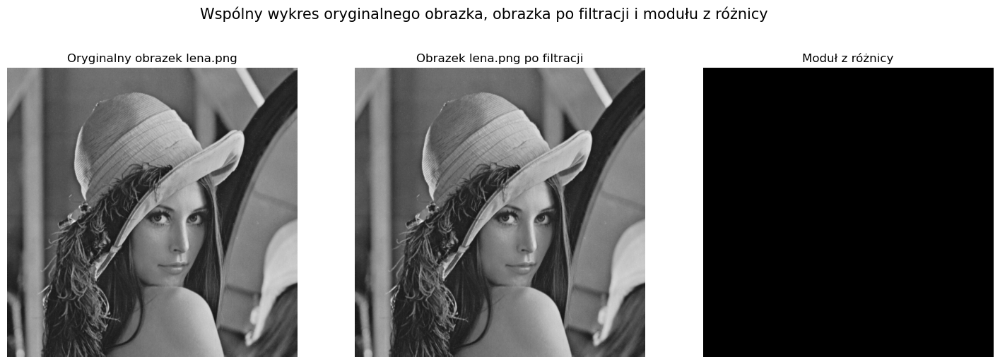

In [18]:
# odchylenie standardowe 0.25
lena_gauss3 = np.zeros_like(lena)
cv2.filter2D(src = lena, dst = lena_gauss3, ddepth = -1, kernel = kernel3)
show_original_filter_abs(lena, lena_gauss3, "lena.png")

#### Porównanie naszego rozwiązania z funkcją `cv2.GaussianBlur`

Porównuję obrazki po przeflitrowaniu dla odchylenia standardowego 0.5.

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

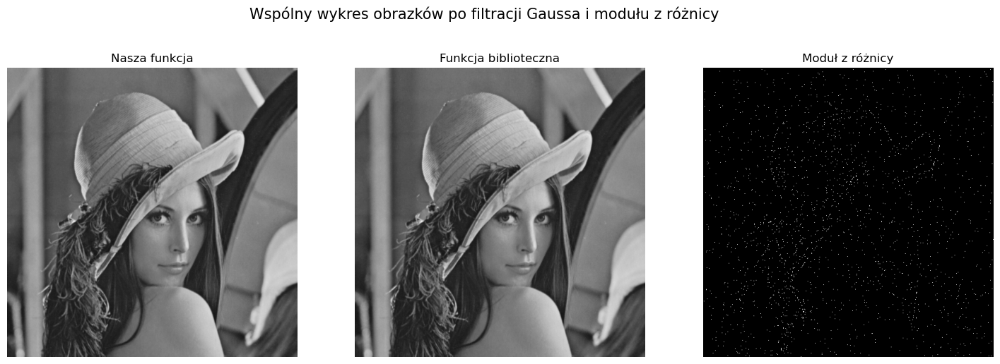

In [19]:
lena_gauss_lib = np.zeros_like(lena)
cv2.GaussianBlur(src = lena, dst = lena_gauss_lib, ksize = (5, 5), sigmaX = 0.5)
diff_abs = np.abs(lena_gauss1 - lena_gauss_lib)
    
fig, axs = plt.subplots(1, 3)
fig.set_size_inches(18, 6)
fig.suptitle("Wspólny wykres obrazków po filtracji Gaussa i modułu z różnicy", fontsize = 15)

axs[0].imshow(lena_gauss1, 'gray', vmin = 0, vmax = 255)
axs[0].set_title("Nasza funkcja")
axs[0].axis('off')

axs[1].imshow(lena_gauss_lib, 'gray', vmin = 0, vmax = 255)
axs[1].set_title("Funkcja biblioteczna")
axs[1].axis('off')

axs[2].imshow(diff_abs, 'gray', vmin = 0, vmax = 255)
axs[2].set_title("Moduł z różnicy")
axs[2].axis('off')

## Filtry nieliniowe $-$ mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowa wartość piksela wybierana jest któraś z wartości otoczenia, według jakiegoś wybranego wskaźnika (np. wartość największa, najmniejsza czy właśnie mediana).

1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję `cv2.medianBlur`, wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga - taki sam efekt da również użycie funkcji `signal.medfilt2d`.

In [20]:
lenaSzum = cv2.imread('lenaSzum.png') 
lenaSzum = cv2.cvtColor(lenaSzum, cv2.COLOR_BGR2GRAY)

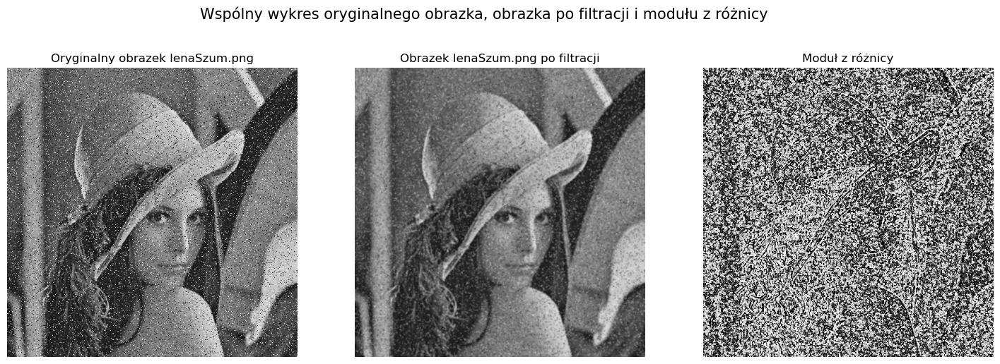

In [21]:
# filtracja uśredniająca
lenaSzum_filtered = np.zeros_like(lenaSzum)
cv2.filter2D(src = lenaSzum, dst = lenaSzum_filtered, ddepth = -1, kernel = normalized_kernel())
show_original_filter_abs(lenaSzum, lenaSzum_filtered, "lenaSzum.png")

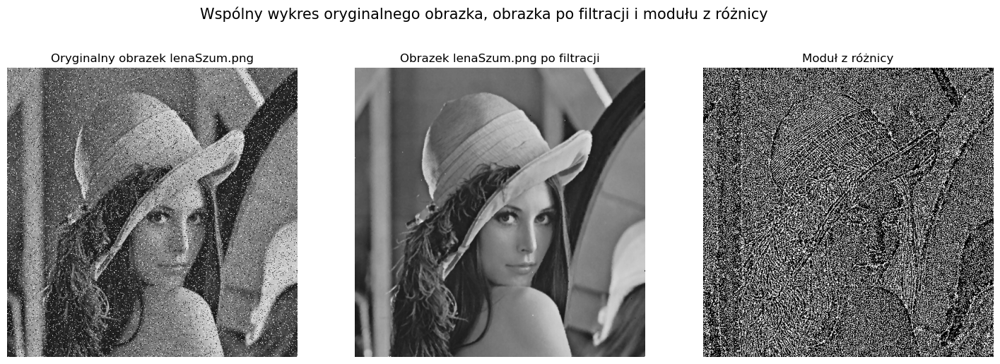

In [22]:
# filtracja medianowa
lenaSzum_filtered = np.zeros_like(lenaSzum)
cv2.medianBlur(src = lenaSzum, dst = lenaSzum_filtered, ksize = 3)
show_original_filter_abs(lenaSzum, lenaSzum_filtered, "lenaSzum.png")


---

#### Która filtracja lepiej radzi sobie z tego typu szumem?

Filtracja medianowa zdecydowanie lepiej radzi sobie z tego typu szumem, obraz po filtracji wygląda bardzo podobnie do oryginalnego obrazka (bez szumu). Filtracja uśredniająca nieco zmniejszyła, "wygładziła" szum, ale obraz wynikowy wciąż pozostaje zaszumiony. 

---


2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

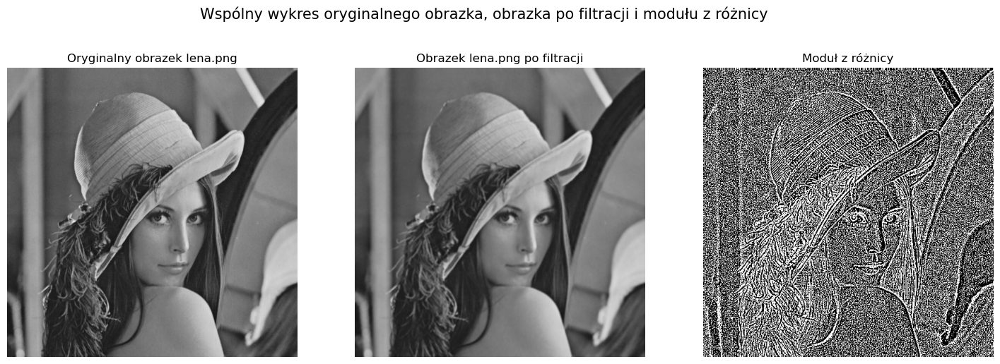

In [23]:
# filtracja uśredniająca
lena_filtered = np.zeros_like(lena)
cv2.filter2D(src = lena, dst = lena_filtered, ddepth = -1, kernel = normalized_kernel())
show_original_filter_abs(lena, lena_filtered, "lena.png")

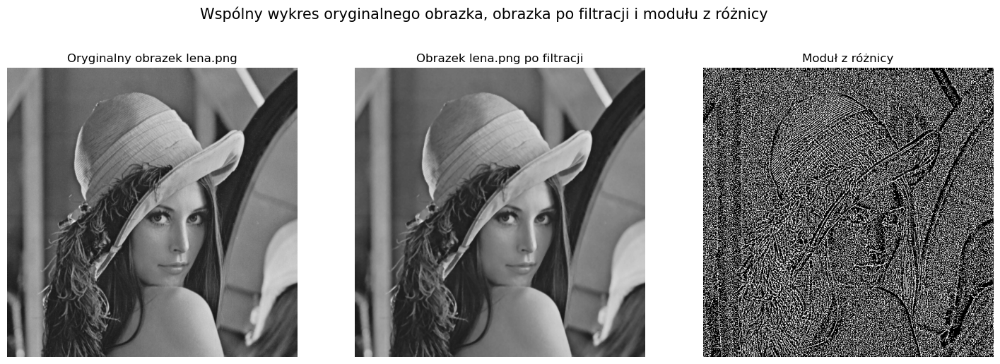

In [24]:
# filtracja medianowa
lena_filtered = np.zeros_like(lena)
cv2.medianBlur(src = lena, dst = lena_filtered, ksize = 3)
show_original_filter_abs(lena, lena_filtered, "lena.png")


---

#### W której filtracji krawędzie zostają lepiej zachowane?

Krawędzie zostają lepiej zachowane w filtracji medianowej, obraz wynikowy po tej filtracji jest ostrzejszy (choć dla małego rozmiaru filtra, 3x3, nie jest to szczególnie widoczne).

---


3. Ciekawy efekt można uzyskać, wykonując filtrację medianową wielokrotnie. Określa się go mianem  *posteryzacji*.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).

Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt `x`, `+`), a jako wynik brana jest mediana ze zbioru: wartość elementu centralnego, mediana z `x` i mediana z `+`,
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).

Warto zdawać sobie sprawę z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

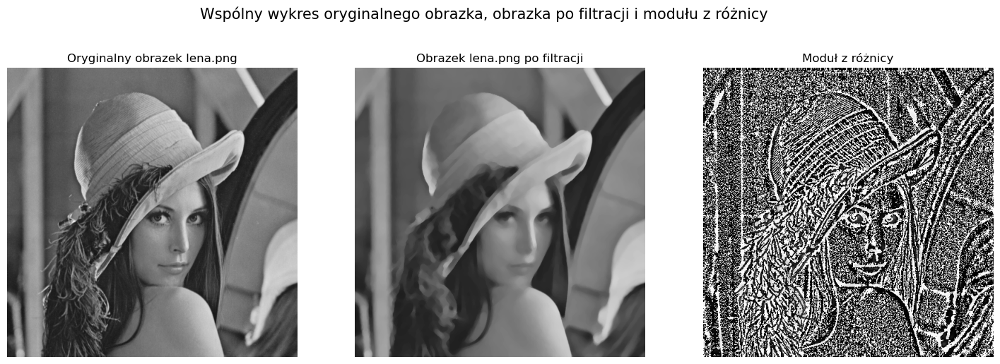

In [25]:
lena_orig = lena
lena_filtered = np.zeros_like(lena)

for i in range(10):
    cv2.medianBlur(src = lena_orig, dst = lena_filtered, ksize = 5)
    lena_orig = lena_filtered
    
show_original_filter_abs(lena, lena_filtered, "lena.png")

## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M = 
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowych, gdyż skutkowałoby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`cv2.filter2D`). Przed wyświetleniem wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodanie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje. 
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach.

In [26]:
# pomocnicza funkcja do wyświetlenia obrazu oryginalnego i po filtracji po obu normalizacjach
def show_original_filter_norm(original, filtered, orig_name):
    filter_scale = filtered + 128
    filter_abs = np.abs(filtered)
    
    fig, axs = plt.subplots(1, 3)
    fig.set_size_inches(18, 6)
    fig.suptitle("Wspólny wykres oryginalnego obrazka oraz obrazka przefiltrowanego po obu normalizacjach", fontsize = 15)
    
    axs[0].imshow(original, 'gray', vmin = 0, vmax = 255)
    axs[0].set_title(f"Oryginalny obrazek {orig_name}")
    axs[0].axis('off')
    
    axs[1].imshow(filter_scale, 'gray', vmin = 0, vmax = 255)
    axs[1].set_title("Normalizacja poprzez skalowanie")
    axs[1].axis('off')
    
    axs[2].imshow(filter_abs, 'gray', vmin = 0, vmax = 255)
    axs[2].set_title("Normalizacja poprzez moduł")
    axs[2].axis('off')

In [27]:
moon = cv2.imread('moon.png') 
moon = cv2.cvtColor(moon, cv2.COLOR_BGR2GRAY)

In [28]:
M = np.array([[0, 1, 0], 
              [1, -4, 1], 
              [0, 1, 0]])

# po podzieleniu przez 9 nic zbytnio nie widać i wydaje mi się, że nie jest to oczekiwany efekt
# dlatego tutaj i w niektórych miejscach poniżej nie "normalizuję" masek
# M = M / 9

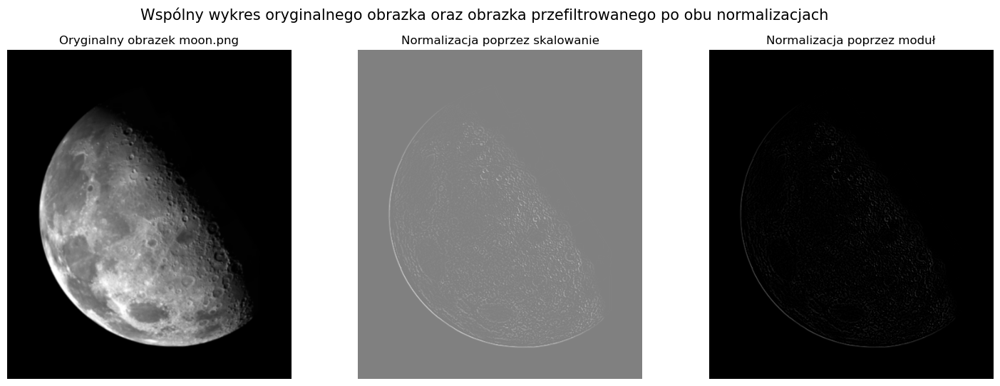

In [29]:
moon_filtered = np.zeros_like(moon)
cv2.filter2D(src = moon, dst = moon_filtered, ddepth = -1, kernel = M)
show_original_filter_norm(moon, moon_filtered, "moon.png")

5. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy od maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.

Uwaga - aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.

In [30]:
moon_sign = moon.astype(np.int32)
moon_sum = (moon_sign + moon_filtered)
moon_abs = np.abs(moon_sign - moon_filtered)

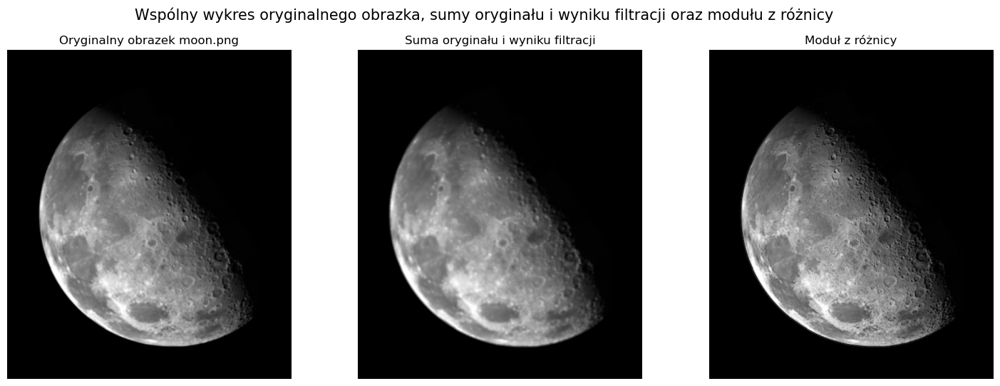

In [31]:
fig, axs = plt.subplots(1, 3)
fig.set_size_inches(18, 6)
fig.suptitle("Wspólny wykres oryginalnego obrazka, sumy oryginału i wyniku filtracji oraz modułu z różnicy", fontsize = 15)

axs[0].imshow(moon, 'gray', vmin = 0, vmax = 255)
axs[0].set_title("Oryginalny obrazek moon.png")
axs[0].axis('off')

axs[1].imshow(moon_sum, 'gray', vmin = 0, vmax = 255)
axs[1].set_title("Suma oryginału i wyniku filtracji")
axs[1].axis('off')

axs[2].imshow(moon_abs, 'gray', vmin = 0, vmax = 255)
axs[2].set_title("Moduł z różnicy")
axs[2].axis('off')

print(end = '')

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa, przeprowadź detekcję krawędzi poprzez wykonanie konwolucji obrazu z daną maską:

\begin{equation}
    R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
    R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy):

\begin{equation}
    P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
    P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie "prostopadłe"):

\begin{equation}
    S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
    S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}
Przeprowadź detekcję krawędzi za pomocą gradientu Sobela. 

In [32]:
kw = cv2.imread('kw.png') 
kw = cv2.cvtColor(kw, cv2.COLOR_BGR2GRAY)

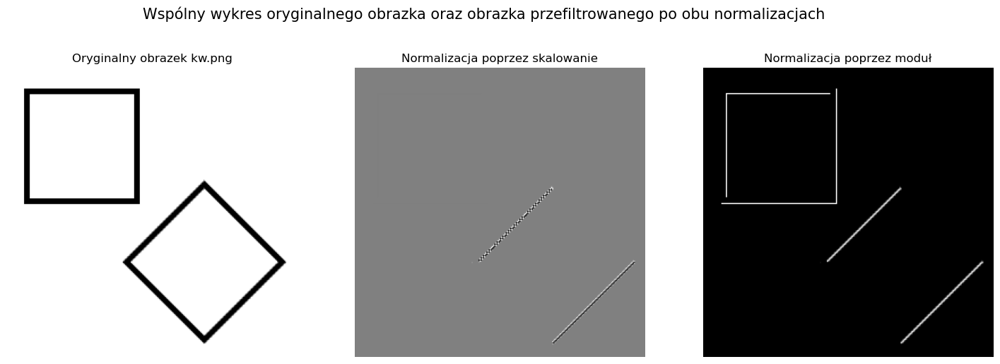

In [33]:
# gradient Robertsa #1
R1 = np.array([[0, 0, 0], 
               [-1, 0, 0], 
               [0, 1, 0]])

# R1 = R1 / 9

kw_filtered = np.zeros_like(kw)
cv2.filter2D(src = kw, dst = kw_filtered, ddepth = -1, kernel = R1)
show_original_filter_norm(kw, kw_filtered, "kw.png")

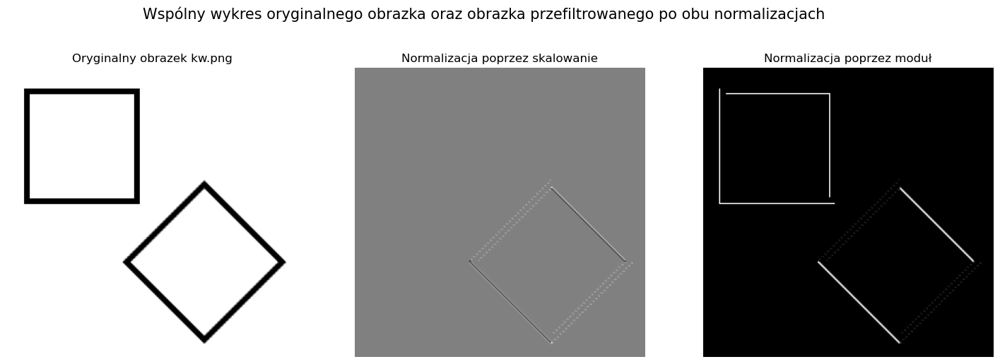

In [34]:
# gradient Robertsa #2
R2 = np.array([[0, 0, 0], 
               [0, 0, -1], 
               [0, 1, 0]])

# R2 = R2 / 9

kw_filtered = np.zeros_like(kw)
cv2.filter2D(src = kw, dst = kw_filtered, ddepth = -1, kernel = R2)
show_original_filter_norm(kw, kw_filtered, "kw.png")

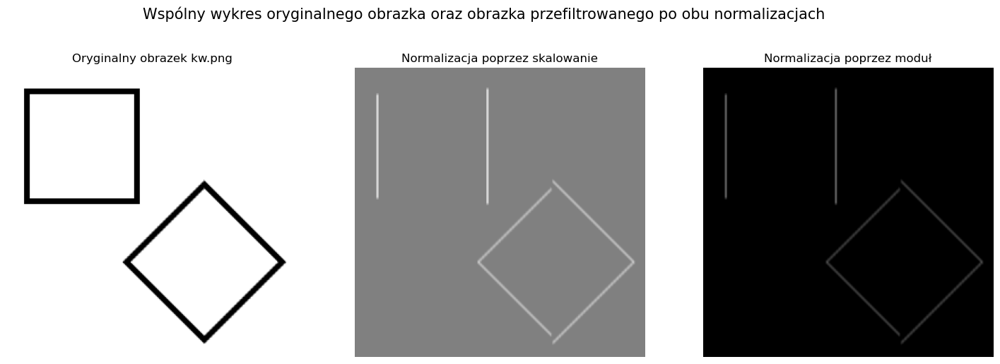

In [35]:
# gradient Prewitta pionowy
P1 = np.array([[-1, 0, 1], 
               [-1, 0, 1], 
               [-1, 0, 1]])

P1 = P1 / 9

kw_filtered = np.zeros_like(kw)
cv2.filter2D(src = kw, dst = kw_filtered, ddepth = -1, kernel = P1)
show_original_filter_norm(kw, kw_filtered, "kw.png")

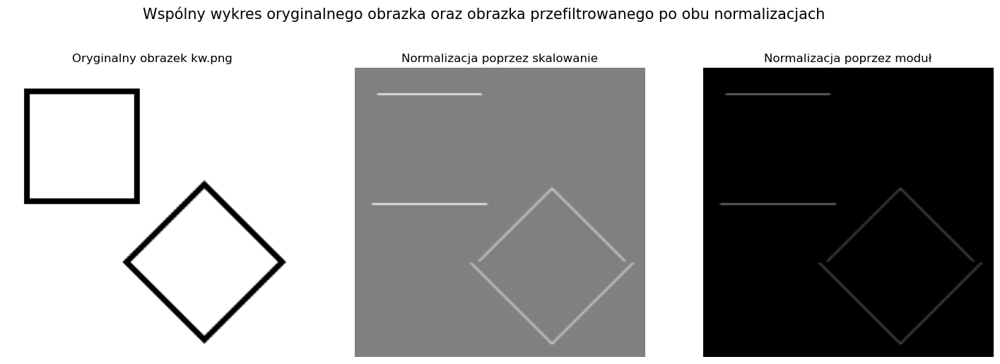

In [36]:
# gradient Prewitta poziomy
P2 = np.array([[-1, -1, -1], 
               [0, 0, 0], 
               [1, 1, 1]])

P2 = P2 / 9

kw_filtered = np.zeros_like(kw)
cv2.filter2D(src = kw, dst = kw_filtered, ddepth = -1, kernel = P2)
show_original_filter_norm(kw, kw_filtered, "kw.png")

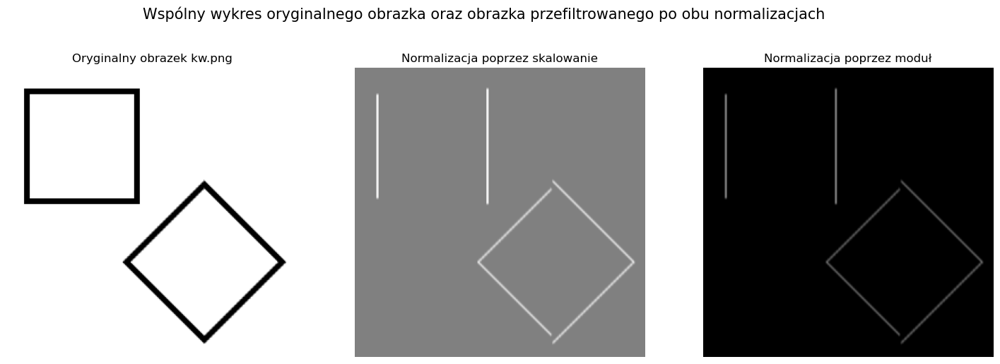

In [37]:
# gradient Sobela pionowy
S1 = np.array([[-1, 0, 1], 
               [-2, 0, 2], 
               [-1, 0, 1]])

S1 = S1 / 9

kw_filtered = np.zeros_like(kw)
cv2.filter2D(src = kw, dst = kw_filtered, ddepth = -1, kernel = S1)
show_original_filter_norm(kw, kw_filtered, "kw.png")

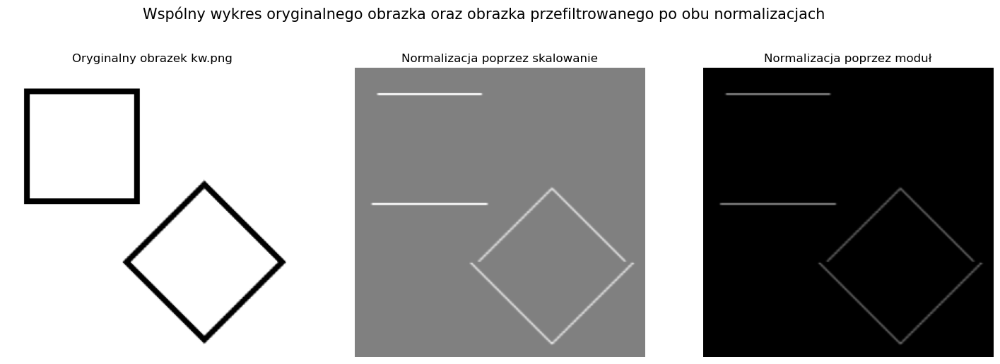

In [38]:
# gradient Sobela poziomy
S2 = np.array([[-1, -2, -1], 
               [0, 0, 0], 
               [1, 2, 1]])

S2 = S2 / 9

kw_filtered = np.zeros_like(kw)
cv2.filter2D(src = kw, dst = kw_filtered, ddepth = -1, kernel = S2)
show_original_filter_norm(kw, kw_filtered, "kw.png")

5. Na podstawie dwóch ortogonalnych masek np. Sobela, można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:

\begin{equation}
    OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}

gdzie $OW$ to obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1, S2$ - maski Sobela, a $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga - proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego (na typ ze znakiem).

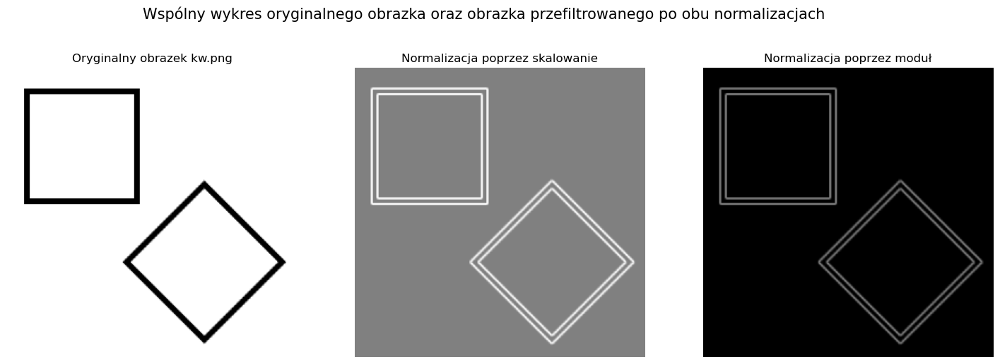

In [39]:
# filtr kombinowany - pierwiastek z sumy kwadratów
kw_S1 = cv2.filter2D(src = kw.astype(np.int16), ddepth = -1, kernel = S1)
kw_S2 = cv2.filter2D(src = kw.astype(np.int16), ddepth = -1, kernel = S2)

kw_filtered = np.sqrt(kw_S1.astype(np.int32) ** 2 + kw_S2.astype(np.int32) ** 2)
show_original_filter_norm(kw, kw_filtered, "kw.png")

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia). 
Zaimplementuj tę wersję. 

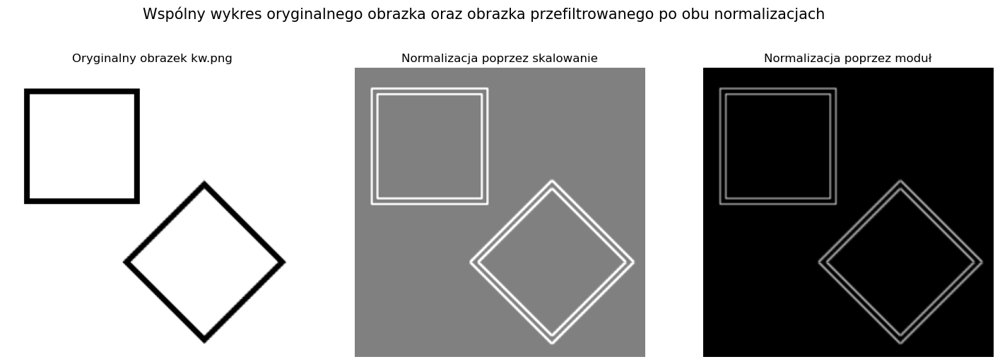

In [40]:
# filtr kombinowany - suma modułów
kw_filtered = np.abs(kw_S1.astype(np.int32)) + np.abs(kw_S2.astype(np.int32))
show_original_filter_norm(kw, kw_filtered, "kw.png")

7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

In [41]:
jet = cv2.imread('jet.png') 
jet = cv2.cvtColor(jet, cv2.COLOR_BGR2GRAY)

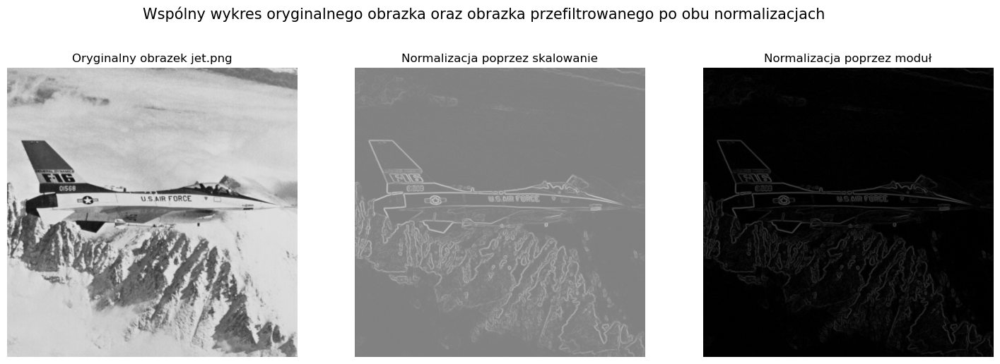

In [42]:
# filtr kombinowany - pierwiastek z sumy kwadratów
jet_S1 = cv2.filter2D(src = jet.astype(np.int16), ddepth = -1, kernel = S1)
jet_S2 = cv2.filter2D(src = jet.astype(np.int16), ddepth = -1, kernel = S2)

jet_filtered = np.sqrt(jet_S1.astype(np.int32) ** 2 + jet_S2.astype(np.int32) ** 2)
show_original_filter_norm(jet, jet_filtered, "jet.png")

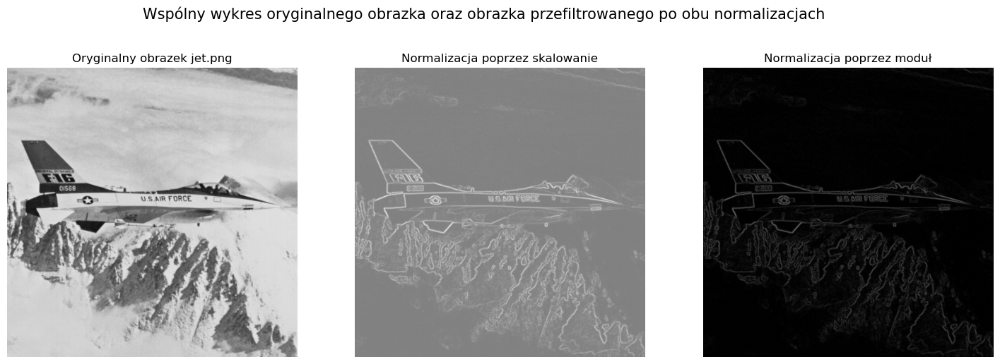

In [43]:
# filtr kombinowany - suma modułów
jet_filtered = np.abs(jet_S1.astype(np.int32)) + np.abs(jet_S2.astype(np.int32))
show_original_filter_norm(jet, jet_filtered, "jet.png")